In [17]:
import pandas as pd
import geopandas as gpd
import rasterio as rio
from rasterio.plot import show, show_hist
import rioxarray as rxr
from rioxarray import merge
import xarray as xr
# import salem

import sqlalchemy as db
import geoalchemy2

import os
import shutil
import zipfile

from geocube.api.core import make_geocube

import hvplot.pandas  # noqa
import hvplot.xarray  # noqa
import cartopy.crs as ccrs
import cartopy
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

import bokeh
import holoviews as hv
import geoviews as gv

from holoviews import opts, dim
import hvplot 
import panel as pn
import panel.widgets as pnw
import geoviews.feature as gf

import netCDF4

import regionmask
from datetime import datetime

import warnings
from IPython.display import display, HTML

In [2]:
# from eodag import EODataAccessGateway, setup_logging

# setup_logging(1) # 0: nothing, 1: only progress bars, 2: INFO, 3: DEBUG

# dag = EODataAccessGateway()
# geometry = "POLYGON ((12.216886 41.669886, 12.216886 41.797987, 12.453162 41.797987, 12.453162 41.669886, 12.216886 41.669886))"
# search_results, total_count = dag.search(
#   productType="S2_MSI_L2A",
#   geom=geometry,
#   start="2022-07-01",
#   end="2022-08-01",
#   cloudCover=16,
# )

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
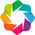

In [3]:
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline
%config Completer.use_jedi = False
warnings.filterwarnings('ignore')
hv.extension('bokeh')

# Area of Interest geojson

In [4]:
countries = gpd.read_file("data/custom.geo.json")

In [14]:
aoi = countries.loc[countries['sovereignt'].isin(['Mozambique','Zambia'])]

<AxesSubplot:>

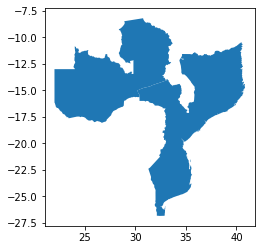

In [15]:
aoi.plot()

In [16]:
aoi.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## With GeoCube (not used)

In [18]:
out_grid = make_geocube(
    vector_data=aoi,    
#     measurements=["Malawi"],
    resolution=(-0.1, 0.1),    
)
out_grid.rio.to_raster("my_rasterized_column.tif")

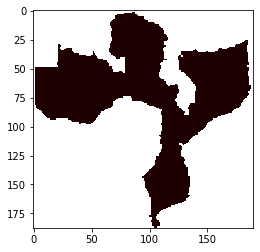

In [20]:
src = rio.open('my_rasterized_column.tif')
array = src.read(1)
array.shape
plt.imshow(array, cmap='pink')

# Clipping Rasters

In [21]:
min_temp_daily = 'data/noaa/tmin.2022.nc'

In [22]:
ds_temp_min = xr.open_dataset(min_temp_daily, chunks={"time": 10})

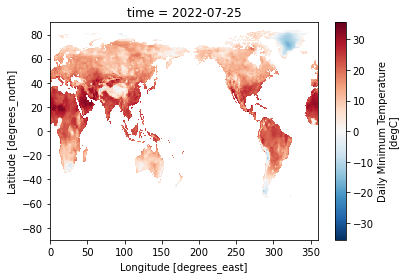

In [23]:
ds_temp_min.tmin.sel(time='2022-07-25T00:00:00.000000000').plot()

In [24]:
proj = ccrs.Orthographic(-90, 30)

In [25]:
ds_temp_min.rio.set_spatial_dims(x_dim="lon", y_dim="lat", inplace=True)

<xarray.Dataset>
Dimensions:  (lat: 360, lon: 720, time: 206)
Coordinates:
  * lat      (lat) float32 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon      (lon) float32 0.25 0.75 1.25 1.75 2.25 ... 358.2 358.8 359.2 359.8
  * time     (time) datetime64[ns] 2022-01-01 2022-01-02 ... 2022-07-25
Data variables:
    tmin     (time, lat, lon) float32 dask.array<chunksize=(10, 360, 720), meta=np.ndarray>
Attributes:
    Conventions:    CF-1.0
    Source:         ftp://ftp.cpc.ncep.noaa.gov/precip/wd52ws/global_temp/
    References:     https://www.psl.noaa.gov/data/gridded/data.cpc.globaltemp...
    version:        V1.0
    title:          CPC GLOBAL TEMP V1.0
    dataset_title:  CPC GLOBAL TEMP
    history:        Updated 2022-07-26 15:42:18

In [26]:
ds_temp_min.rio.write_crs("epsg:4326", inplace=True)

<xarray.Dataset>
Dimensions:      (lat: 360, lon: 720, time: 206)
Coordinates:
  * lat          (lat) float32 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * lon          (lon) float32 0.25 0.75 1.25 1.75 ... 358.2 358.8 359.2 359.8
  * time         (time) datetime64[ns] 2022-01-01 2022-01-02 ... 2022-07-25
    spatial_ref  int32 0
Data variables:
    tmin         (time, lat, lon) float32 dask.array<chunksize=(10, 360, 720), meta=np.ndarray>
Attributes:
    Conventions:    CF-1.0
    Source:         ftp://ftp.cpc.ncep.noaa.gov/precip/wd52ws/global_temp/
    References:     https://www.psl.noaa.gov/data/gridded/data.cpc.globaltemp...
    version:        V1.0
    title:          CPC GLOBAL TEMP V1.0
    dataset_title:  CPC GLOBAL TEMP
    history:        Updated 2022-07-26 15:42:18

In [28]:
clipped = ds_temp_min.rio.clip(aoi.geometry, aoi.crs, drop=True)

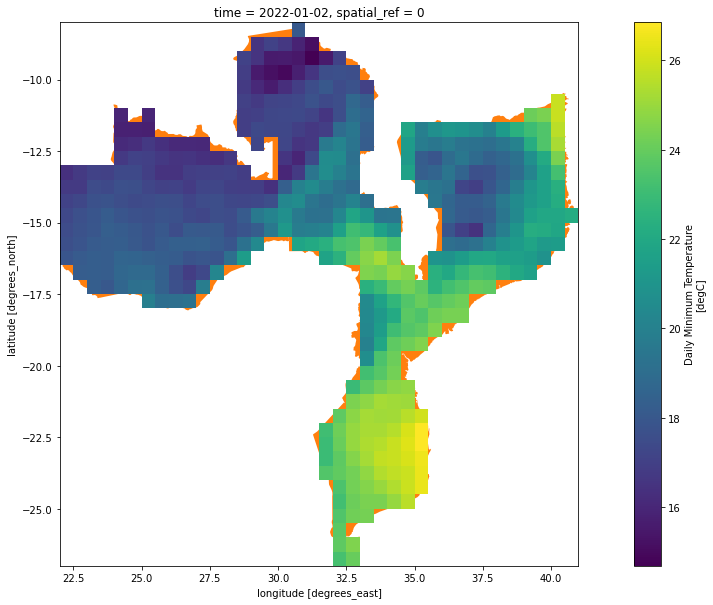

In [30]:
ax = aoi.plot(figsize=(20,10), color='C1')  
clipped.isel(time=1).tmin.plot(ax=ax)

In [31]:
clipped.to_netcdf('final/clip_tmin.nc')

In [32]:
clipped['tmin'].hvplot(groupby='time', cmap='Reds', projection=ccrs.PlateCarree())

:DynamicMap   [time]
   :Image   [lon,lat]   (tmin)

# Clipping Single File Xarray

In [33]:
def clip_xarray(in_file, aoi, out_file, lx='lon', ly='lat'):
    ds = xr.open_dataset(in_file, chunks={"time": 10})
    ds.rio.set_spatial_dims(x_dim=lx, y_dim=ly, inplace=True)
    ds.rio.write_crs("epsg:4326", inplace=True)
    clipped = ds.rio.clip(aoi.geometry, aoi.crs, drop=True)
    clipped.to_netcdf(f"final/{out_file}.nc")

In [34]:
max_temp_daily = 'data/noaa/tmax.2022.nc'

In [35]:
clip_xarray(max_temp_daily, aoi, 'clip_tmax')

In [36]:
chirps_daily_2020 = 'data/chirps/chirps-v2.0.2022.days_p05.nc'

In [37]:
clip_xarray(chirps_daily_2020, aoi, 'clip_prec','longitude','latitude')

In [ ]:
# chirps_dekad_2020 = 'data/chirps/chirps-v2.0.2020.dekads.nc'

In [ ]:
# clip_xarray(chirps_dekad_2020,countries,'data/eaf_prec_dek','longitude','latitude')

# Clipping Multiple Files Xarray

In [28]:
def clip_xarraymultiple(ds, aoi, out_file, lx='lon', ly='lat'):    
    ds.rio.set_spatial_dims(x_dim=lx, y_dim=ly, inplace=True)
    ds.rio.write_crs("epsg:4326", inplace=True)
    clipped = ds.rio.clip(aoi.geometry, aoi.crs, drop=True)
    clipped.to_netcdf(out_file + '.nc')

In [17]:
# ds_multiple_days_soil_moisture = xr.open_mfdataset(files, concat_dim='time', coords='minimal', compat='override', data_vars='minimal', combine='nested', parallel=True,engine='netcdf4')

In [18]:
# ds_multiple_days_soil_moisture

<xarray.Dataset>
Dimensions:         (time: 91, lat: 720, lon: 1440)
Coordinates:
  * lon             (lon) float64 -179.9 -179.6 -179.4 ... 179.4 179.6 179.9
  * lat             (lat) float64 89.88 89.62 89.38 ... -89.38 -89.62 -89.88
  * time            (time) datetime64[ns] 2022-04-01 2022-04-02 ... 2022-06-30
Data variables:
    sm              (time, lat, lon) float32 dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    sm_uncertainty  (time, lat, lon) float32 dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    flag            (time, lat, lon) float32 dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    freqbandID      (time, lat, lon) float32 dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    dnflag          (time, lat, lon) float32 dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    mode            (time, lat, lon) float32 dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    sensor          (time, lat, lon) float32 dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    t0              (time, lat, lon) datetime64[ns] dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
Attributes: (12/40)
    title:                      C3S Surface Soil Moisture merged ACTIVE Product
    institution:                EODC (AUT); TU Wien (AUT); VanderSat B.V. (NL)
    contact:                    C3S_SM_Science@eodc.eu
    source:                     WARP 5.5R1.1/AMI-WS/ERS12 Level 2 Soil Moistu...
    platform:                   ERS-1, ERS-2, METOP-A, METOP-B
    sensor:                     AMI-WS, ASCAT-A, ASCAT-B
    ...                         ...
    geospatial_vertical_max:    0.0
    geospatial_lat_units:       degrees_north
    geospatial_lon_units:       degrees_east
    geospatial_lat_resolution:  0.25 degree
    geospatial_lon_resolution:  0.25 degree
    spatial_resolution:         25km

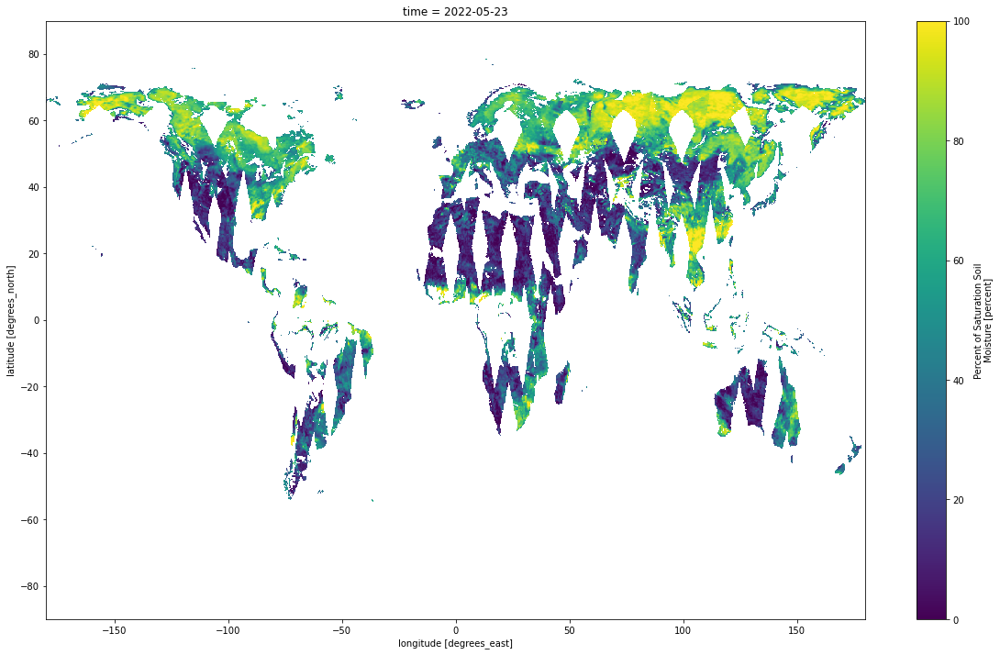

In [37]:
ds_multiple_years_soil_moisture.sm.sel(time='2022-05-23T00:00:00.000000000').plot(figsize=(20,12))

In [39]:
ds_multiple_years_soil_moisture['sm'].hvplot(groupby='time', cmap='Reds', projection=ccrs.PlateCarree(), x='lon', y='lat', figsize=(20,12),widget_location='bottom')

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2022-04-01 ...]), value=numpy.datetime64('2022-04-..., value_throttled=numpy.datetime64('2022-04-..., width=250)
        [2] HSpacer()

# FCOVER clip and merge

In [48]:
base_path = 'data/fcover/'
zip_list = []
for root, dirs, files in os.walk(base_path):    
    for name in files:
        if name.endswith((".zip")):
            zip_list.append(root+'/'+name)

In [51]:
test_zips = zip_list[0:10]
test_zips

['data/fcover/FCOVER300_RT0_202204100000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202204100000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202204200000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202204200000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202204300000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202204300000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202205100000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202205100000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202205200000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202205200000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202205310000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202205310000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202206100000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202206100000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202206200000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER300-RT0_202206200000_GLOBE_OLCI_V1.1.2.zip',
 'data/fcover/FCOVER300_RT0_202206300000_GLOBE_OLCI_V1.1.2/c_gls_FCOVER3

In [58]:
export_dir = r"final/fcover"

In [110]:
# *********************************************************************************************
# for single_zip in test_zips:
for single_zip in zip_list:
    with zipfile.ZipFile(single_zip) as zip_file:
        for member in zip_file.namelist():
            filename = os.path.basename(member)
            # skip directories        
            if '-FCOVER' in filename:                        
                # copy file (taken from zipfile's extract)
                source = zip_file.open(member)            
                target = open(os.path.join(export_dir, filename), "wb")            
                with source, target:
                    shutil.copyfileobj(source, target)
# *********************************************************************************************

In [ ]:
# zip_obj = zipfile.ZipFile(zip_list[0], "r")
# zip_obj

# [mright.split('/')[1] for mright in zip_obj.namelist() if '-FCOVER' in mright]
# [mright.split('.')[0].split('/')[1] for mright in zip_obj.namelist() if '-FCOVER' in mright]
# [zip_obj.extract(mright,mright.split('.')[0].split('/')[1]) for mright in zip_obj.namelist() if '-FCOVER' in mright]

In [111]:
tiff_files = [os.path.join(export_dir,f) for f in os.listdir(export_dir) if os.path.isfile(os.path.join(export_dir, f)) and f.endswith('.tiff')]
tiff_files

['final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202204100000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202204200000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202204300000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202205100000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202205200000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202205310000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202206100000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202206200000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202206300000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202207100000_CUSTOM_OLCI_V1.1.2.tiff',
 'final/fcover\\c_gls_FCOVER300-RT0-FCOVER_202207200000_CUSTOM_OLCI_V1.1.2.tiff']

In [112]:
time_var = [datetime.strptime(tiff_date.split('_')[3][:-4],'%Y%m%d') for tiff_date in tiff_files]
sorted(time_var)

[datetime.datetime(2022, 4, 10, 0, 0),
 datetime.datetime(2022, 4, 20, 0, 0),
 datetime.datetime(2022, 4, 30, 0, 0),
 datetime.datetime(2022, 5, 10, 0, 0),
 datetime.datetime(2022, 5, 20, 0, 0),
 datetime.datetime(2022, 5, 31, 0, 0),
 datetime.datetime(2022, 6, 10, 0, 0),
 datetime.datetime(2022, 6, 20, 0, 0),
 datetime.datetime(2022, 6, 30, 0, 0),
 datetime.datetime(2022, 7, 10, 0, 0),
 datetime.datetime(2022, 7, 20, 0, 0)]

In [105]:
# tiff_files_new = [f.split(".")[0].split('\\')[-1].split('-')[-1].replace('CUSTOM_OLCI_V1','OLCI') for f in tiff_files]

In [113]:
# all_tiff = zip(tiff_files,tiff_files_new)
# for i in all_tiff:
#     print(i)

In [114]:
date_analisys = pd.Series(time_var)
date_analisys.value_counts()

2022-04-10    1
2022-04-20    1
2022-04-30    1
2022-05-10    1
2022-05-20    1
2022-05-31    1
2022-06-10    1
2022-06-20    1
2022-06-30    1
2022-07-10    1
2022-07-20    1
dtype: int64

## Single Tif

In [ ]:
# Open into an xarray.DataArray
geotiff_da = xr.open_rasterio(tiff_files[0])

# Covert our xarray.DataArray into a xarray.Dataset
geotiff_ds = geotiff_da.to_dataset('band')

# Rename the variable to a more useful name
geotiff_ds = geotiff_ds.rename({1: 'fcover'})

In [ ]:
geotiff_ds

In [ ]:
geotiff_ds['fcover_val'] = geotiff_ds.fcover * (1/250)

In [ ]:
geotiff_ds

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
geotiff_ds.fcover_val.plot(cmap="Greens", ax=ax)
countries.plot(color='None', edgecolor='teal', linewidth=2, ax=ax,zorder=4)
ax.set_title("FCover")
ax.set_axis_off()
plt.show()

In [ ]:
# src_fcover = rio.open(tiff_files[0])
# array_fcover = src_fcover.read(1)
# plt.imshow(array_fcover, cmap='pink');

In [ ]:
# array_fcover.shape

In [ ]:
# show_hist(src_fcover, bins=50, lw=0.0, stacked=False, alpha=0.3,histtype='stepfilled', title="Histogram")

In [ ]:
# array_fcover.min(), array_fcover.max()

## Multiple Tif

In [115]:
# Create variable used for time axis
time_var = xr.Variable('time', time_var)

# Load in and concatenate all individual GeoTIFFs
geotiffs_da = xr.concat([xr.open_rasterio(i) for i in tiff_files], dim=time_var)

# Covert our xarray.DataArray into a xarray.Dataset
geotiffs_ds = geotiffs_da.to_dataset('band')

# Rename the variable to a more useful name
geotiffs_ds = geotiffs_ds.rename({1: 'fcover'})

geotiffs_ds

<xarray.Dataset>
Dimensions:  (time: 11, y: 9083, x: 8209)
Coordinates:
  * y        (y) float64 -2.482 -2.485 -2.488 -2.491 ... -29.51 -29.51 -29.51
  * x        (x) float64 21.4 21.4 21.4 21.4 21.41 ... 45.82 45.82 45.82 45.82
  * time     (time) datetime64[ns] 2022-04-10 2022-04-20 ... 2022-07-20
Data variables:
    fcover   (time, y, x) uint8 236 231 233 231 231 234 ... 255 255 255 255 255
Attributes: (12/29)
    transform:            (0.0029761904762040103, 0.0, 21.394345239011074, 0....
    crs:                  +init=epsg:4326
    res:                  (0.0029761904762040103, 0.002976190476189799)
    is_tiled:             1
    nodatavals:           (255.0,)
    scales:               (0.004,)
    ...                   ...
    sensor:               OLCI
    source:               Derived from EO satellite imagery
    time_coverage_end:    2022-04-10T23:59:59Z
    time_coverage_start:  2021-09-12T00:00:00Z
    title:                10-daily Fraction of Vegetation Cover 333M: CUSTOM ...
    _NCProperties:        version=2,netcdf=4.6.3,hdf5=1.10.2

In [116]:
geotiffs_ds['fcover_val'] = geotiffs_ds.fcover * (1/250)

In [117]:
geotiffs_ds

<xarray.Dataset>
Dimensions:     (time: 11, y: 9083, x: 8209)
Coordinates:
  * y           (y) float64 -2.482 -2.485 -2.488 -2.491 ... -29.51 -29.51 -29.51
  * x           (x) float64 21.4 21.4 21.4 21.4 ... 45.82 45.82 45.82 45.82
  * time        (time) datetime64[ns] 2022-04-10 2022-04-20 ... 2022-07-20
Data variables:
    fcover      (time, y, x) uint8 236 231 233 231 231 ... 255 255 255 255 255
    fcover_val  (time, y, x) float64 0.944 0.924 0.932 0.924 ... 1.02 1.02 1.02
Attributes: (12/29)
    transform:            (0.0029761904762040103, 0.0, 21.394345239011074, 0....
    crs:                  +init=epsg:4326
    res:                  (0.0029761904762040103, 0.002976190476189799)
    is_tiled:             1
    nodatavals:           (255.0,)
    scales:               (0.004,)
    ...                   ...
    sensor:               OLCI
    source:               Derived from EO satellite imagery
    time_coverage_end:    2022-04-10T23:59:59Z
    time_coverage_start:  2021-09-12T00:00:00Z
    title:                10-daily Fraction of Vegetation Cover 333M: CUSTOM ...
    _NCProperties:        version=2,netcdf=4.6.3,hdf5=1.10.2

In [118]:
del geotiffs_ds.attrs['_NCProperties']

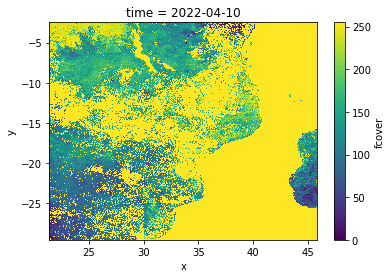

In [119]:
geotiffs_ds.fcover_val.isel(time=0).plot()

In [120]:
# geotiffs_ds.to_netcdf('final/fcover_clip.nc','w')

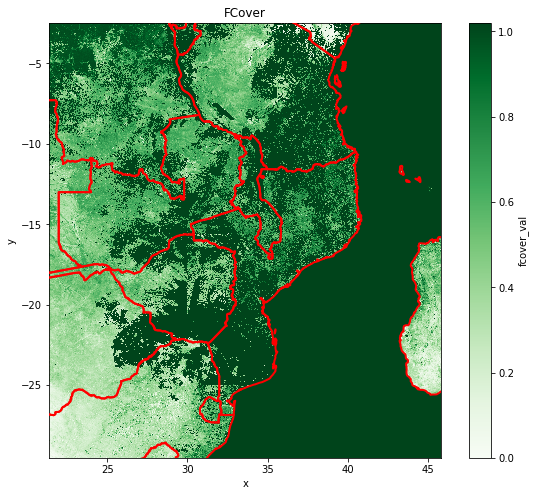

In [124]:
f, ax = plt.subplots(figsize=(10, 8))
geotiffs_ds.fcover_val.isel(time=1).plot(cmap="Greens", ax=ax)
countries.plot(color='None', edgecolor='red', linewidth=2, ax=ax,zorder=4)
ax.set_title("FCover")
# ax.set_axis_off()
plt.show()

In [ ]:
# geotiffs_ds_swap = geotiffs_ds.swap_dims({"x": "lat","y":"lon"})

In [ ]:
# geotiffs_ds_swap.fcover_val.isel(time=1).plot(cmap="RdYlGn");

In [ ]:
# ************************** SALTA **********************************************************
geotiffs_ds['fcover_val'].hvplot(groupby='time', cmap='Reds', projection=ccrs.PlateCarree())
# ************************** SALTA **********************************************************

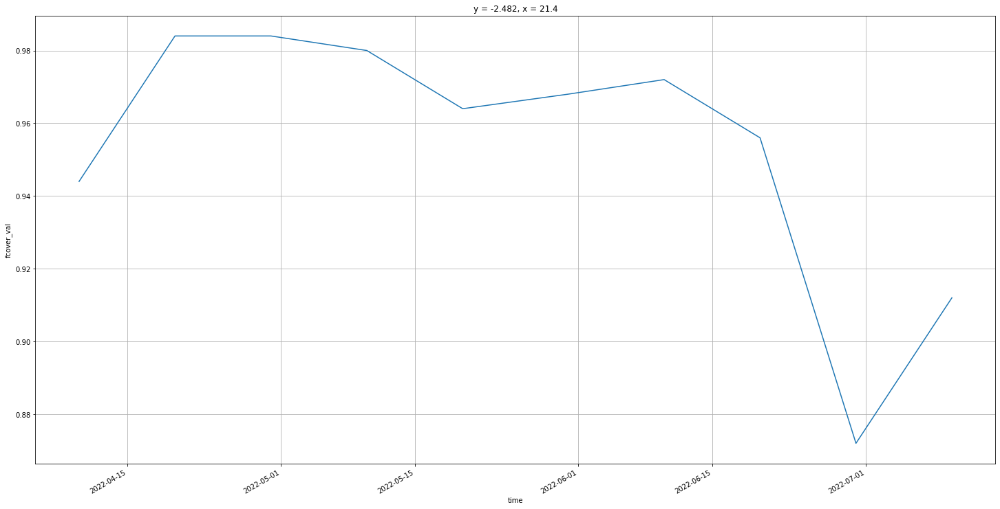

In [123]:
geotiffs_ds.fcover_val.isel(time=slice(0,10)).sel(x=-18.562947,y=35.595497, method='nearest').plot(figsize=(25,12))
plt.grid()

In [ ]:
## MERGING TIFFs
# elements = []
# for val in tiff_files:
#     elements.append(rxr.open_rasterio(val))

# merged = merge.merge_arrays(elements, nodata=0.0)

# image = merged.values
# show(image)

In [ ]:
# !dir data\\fcover

# rastermask with Regionmask - (not used)

In [ ]:
srex = regionmask.defined_regions.srex
plt.figure(figsize=(12,8))
srex.plot();

In [ ]:
# text_kws = dict(
#     bbox=dict(color="none"),
#     path_effects=[pe.withStroke(linewidth=2, foreground="w")],
#     color="#67000d",
#     fontsize=8,
# )

# ax = srex.plot(projection=ccrs.Robinson(), 
#                label="abbrev", 
#                add_ocean=True, 
#                text_kws=text_kws
# )

# ax.set_global()

In [ ]:
# # regions can be selected by number, abbreviation or long name
# regions = [11, "CEU", "S. Europe/Mediterranean"]

# # choose a good projection for regional maps
# proj = ccrs.LambertConformal(central_longitude=15)

# ax = srex[regions].plot(
#     add_ocean=True,
#     resolution="50m",
#     proj=proj,
#     label="abbrev",
# )

# # fine tune the extent
# ax.set_extent([-15, 45, 28, 76], crs=ccrs.PlateCarree())

In [ ]:
# lon = np.arange(-179.5, 180)
# lat = np.arange(-89.5, 90)
# # regionmask.defined_regions.srex

In [ ]:
# mask = regionmask.defined_regions.srex.mask(lon, lat)
# # mask

In [ ]:
# f, ax = plt.subplots(subplot_kw=dict(projection=ccrs.PlateCarree()))
# ax.coastlines()

# mask.plot(ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False);

In [ ]:
# # choose a good projection for regional maps
# proj = ccrs.LambertConformal(central_longitude=-100)

# ax = plt.subplot(111, projection=proj)

# ds_temp_min.isel(time=1).tmin.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree())

# ax.coastlines();

In [ ]:
# EAF_index = regionmask.defined_regions.srex.map_keys("EAF")
# EAF_index

In [ ]:
# airtemps_EAF = ds_temp_min.where(mask == EAF_index)

In [ ]:
# airtemps_EAF

In [ ]:
# # choose a good projection for regional maps
# proj = ccrs.LambertConformal(central_longitude=-100)
# ax = plt.subplot(111, projection=proj)
# regionmask.defined_regions.srex[["EAF"]].plot(ax=ax, add_label=False)
# airtemps_EAF.isel(time=1).tmin.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree())
# ax.coastlines();

In [ ]:
area_mask = regionmask.from_geopandas(countries)
area_mask

In [ ]:
area_mask.plot(label="name", add_coastlines=False);